In [1]:
%cd ..

/workspaces/apartements


In [2]:
#%conda install -c conda-forge pandas plotly scikit-learn pymc arviz bokeh patsy nbformat hiplot flaml catboost xgboost
#conda install hiplot pathlib 

In [3]:
import pandas as pd
import numpy as np

pd.options.plotting.backend = "plotly"

In [4]:
df = pd.read_csv("assets/data/bolig.csv.gzip", compression="gzip", parse_dates=["soldDate"])
df.sample(4)

,estateId,address,zipCode,price,soldDate,propertyType,saleType,sqmPrice,rooms,size,...,change,guid,latitude,longitude,municipalityCode,estateCode,city,groupKey,canGetVR,bfEnr
23429,0,"Nørrebrogade 216, 2. th",2200,14500000,2022-05-16 22:00:00+00:00,3,Fam. Salg,157608.700,3.0,92,...,0.0,70957305-5611-4DAB-A366-C5AFFE1E38D2,55.699364,12.541489,101,409333,København N,1.0,True,6019018
72824,0,"Sortedam Dossering 41B, 5. tv",2200,2700000,2013-09-27 22:00:00+00:00,3,Fam. Salg,32530.121,3.0,83,...,0.0,34889804-A41B-4D1B-858D-6A05B9A9F1B6,55.691776,12.567822,101,693228,København N,NaN,True,152193
50069,0,"Dortheavej 62, 1",2400,6300000,2018-08-20 22:00:00+00:00,3,Alm. Salg,56756.758,4.0,111,...,0.0,78FBFACC-A231-4ED4-A2DF-3F57E56C21A3,55.709892,12.519529,101,102777,København NV,1.0,True,6022853
68755,0,"Laurids Skaus Gade 11, 3. tv",2200,1336475,2014-12-01 23:00:00+00:00,3,Fam. Salg,25216.510,2.0,53,...,0.0,6240B4CD-8AB8-4013-B6D2-1ACE13596992,55.687910,12.544290,101,339289,København N,NaN,True,149824


In [5]:
df.columns

Index(['estateId', 'address', 'zipCode', 'price', 'soldDate', 'propertyType',
       'saleType', 'sqmPrice', 'rooms', 'size', 'buildYear', 'change', 'guid',
       'latitude', 'longitude', 'municipalityCode', 'estateCode', 'city',
       'groupKey', 'canGetVR', 'bfEnr'],
      dtype='object')

In [6]:
# Sorting fam_salg away
SALES_TYPE = "Alm. Salg"
# Sorting apartments away that where sold for under 500.000 and above 9.000.000
LOWER_PRICE, HIGHER_PRICE = 450_000, 9_500_000

# Sorting apartments away that have above 5 roomes doe to the likelyhood of it being under 0.001%procent
NUMBER_OF_ROOMS = 5

# Number of Days from Max Date
DAYS_FROM_MAX_DATE = 31 + 30 + 31 + 30


alm_salg_df = (
    df.loc[
        (df["saleType"].eq(SALES_TYPE))
        & (df["price"].between(LOWER_PRICE, HIGHER_PRICE))
        & (df["rooms"].le(NUMBER_OF_ROOMS))
    ]
    .assign(
        floor=lambda d: d["address"]
        .str.extract(r",\s*(?P<floor>\d+|st)(?=\s*[a-z]*\.?\s|$)")
        .replace("st", 0)
        .fillna(0)
        .astype(int)
    )
    .assign(
        days_from_latest=lambda d: (d["soldDate"].max() - d["soldDate"]).dt.days
    )
    .sort_values(by="soldDate")
    .loc[lambda d: d["days_from_latest"] <= DAYS_FROM_MAX_DATE ]
)

(alm_salg_df
  .sample(5)
  .loc[:, ["price", "rooms", "size", "soldDate"]]
  .assign(soldAge = lambda d: (d["soldDate"].dt.date - pd.to_datetime("1991-01-01")).dt.days/365)
  .loc[:,["price", "rooms", "size", "soldAge"]] 
)

In [7]:
alm_salg_df.columns

Index(['estateId', 'address', 'zipCode', 'price', 'soldDate', 'propertyType',
       'saleType', 'sqmPrice', 'rooms', 'size', 'buildYear', 'change', 'guid',
       'latitude', 'longitude', 'municipalityCode', 'estateCode', 'city',
       'groupKey', 'canGetVR', 'bfEnr', 'floor', 'days_from_latest'],
      dtype='object')

In [8]:
from pathlib import Path
import plotly.express as px

px.set_mapbox_access_token(Path("notebooks/.mapbox_token").read_text())

In [9]:
px.scatter_mapbox(
    alm_salg_df,
    lat="latitude",
    lon="longitude",
    color="size",
    size="price",
    color_continuous_scale=px.colors.cyclical.IceFire,
    size_max=5,
    zoom=11,
    title="Normal Sales Apartments in Copenhagen",
    hover_name="address",
    hover_data=["rooms", "buildYear", "floor"],
    center=dict(
        lat=55.6861,
        lon=12.5388,
    ),
    width=1200,
    height=800,
)

In [10]:
features = [
    "address",
    "zipCode",
    "soldDate",
    "rooms",
    "floor",
    "size",
    "buildYear",
    "latitude",
    "longitude",
    "municipalityCode",
    "estateCode",
    "city",
    "price",
]



In [11]:
explore_data = alm_salg_df[features].astype(
    {
        "rooms": np.int8,
        "size": np.int16,
        "buildYear": np.int32,
        "municipalityCode": np.int32,
        "estateCode": np.int32,
        "zipCode": np.int32,
    }
)
explore_data = (
    explore_data.assign(
        soldYear=lambda d: d["soldDate"].dt.year,
        soldMonth=lambda d: d["soldDate"].dt.month,
    ).drop(columns=["address", "soldDate"])

)

In [12]:
order_columns = [
    "price",
    "size",
    "rooms",
    "floor",
    "longitude",
    "latitude",
    "buildYear",
    "soldMonth",
    "soldYear",
    "zipCode",
    "city",
]

## Middle Age Tools

In [13]:
import hiplot as hip

In [14]:
explore_data.columns[::-1]

Index(['soldMonth', 'soldYear', 'price', 'city', 'estateCode',
       'municipalityCode', 'longitude', 'latitude', 'buildYear', 'size',
       'floor', 'rooms', 'zipCode'],
      dtype='object')

In [15]:
viz = hip.Experiment.from_dataframe(explore_data[order_columns])

In [16]:
viz.display();  # soldMonth has no effect & interestubg suze of 857, I think the correct is 85.7

<IPython.core.display.Javascript object>

In [17]:
explore_data = (
    explore_data
    #.drop(columns=["address", "soldDate"])
    # after the viz, we discovered Build Year 0 and size 857?
    .loc[lambda d: (d['buildYear'].ne(0))]
)

In [18]:
alm_salg_df_filtered = pd.merge(
    alm_salg_df[["address", "soldDate"]],
    explore_data,
    how="inner",
    left_index=True,
    right_index=True,
)

In [19]:
# alm_salg_df_filtered.loc[lambda d: d["floor"].gt(24)]

In [20]:
alm_salg_df_filtered.shape

(1317, 15)

In [21]:
interesting_columns = [
    "price",
    "size",
    "rooms",
    "floor",
    "longitude",
    "latitude",
    "buildYear",
    "soldYear",
    "zipCode",
    "city",
]

In [22]:
from sklearn.model_selection import train_test_split

In [23]:
X = explore_data[
    [
        "size",
        "rooms",
        "longitude",
        "latitude",
        "buildYear",
        "floor",
        "soldYear",
        "zipCode",
        "city",
    ]
]
y = explore_data["price"]

In [24]:
train_data = X.assign(price=y)

In [25]:
train_data.columns

Index(['size', 'rooms', 'longitude', 'latitude', 'buildYear', 'floor',
       'soldYear', 'zipCode', 'city', 'price'],
      dtype='object')

In [26]:
from sklearn.linear_model import LinearRegression
import patsy as ps

In [27]:
train_data.sample(2)

,size,rooms,longitude,latitude,buildYear,floor,soldYear,zipCode,city,price
17319,72,3,12.546550,55.694508,1903,0,2023,2200,København N,3445000
17350,61,2,12.489982,55.672330,1930,2,2023,2500,Valby,2065000


In [28]:
# price ~ size

formula = (
    "price ~ size + C(rooms) + C(buildYear) + latitude + longitude - 1"
)

In [29]:
import warnings

with warnings.catch_warnings():
    warnings.simplefilter(action="ignore", category=FutureWarning)

    y_, X_ = ps.dmatrices(formula, data=train_data)

In [30]:
X_train, X_test, y_train, y_test = train_test_split(
    X_, y_, train_size=0.9, random_state=42
)
y_train, y_test = y_train.ravel(), y_test.ravel()

In [31]:
LinearRegression(n_jobs=-1).fit(X_train, y_train).score(X_test, y_test)

0.7930641348003018

In [32]:
from sklearn.neighbors import KNeighborsRegressor

In [33]:
KNeighborsRegressor(n_jobs=-1, n_neighbors=7).fit(X_train, y_train).score(
    X_test, y_test
)

0.6808533564939792

In [34]:
from sklearn.ensemble import GradientBoostingRegressor, ExtraTreesRegressor

In [35]:
GradientBoostingRegressor(
    learning_rate=0.7,
    n_estimators=107,
    random_state=42,
).fit(
    X_train, y_train
).score(X_test, y_test)

0.863074589559821

In [36]:
ExtraTreesRegressor(n_jobs=-1, 
                    n_estimators=107,
                    random_state=42,
                   ).fit(X_train, y_train).score(
    X_test, y_test
)

0.8529191344585347

In [37]:
from flaml import AutoML

In [38]:
automl = AutoML()

automl_settings = {
    "time_budget": 60 * 7,  # in seconds
    "metric": "rmse",
    "task": "regression",
    "log_file_name": "bolig.log",
    "estimator_list": [
        "xgboost",
        "lgbm",
        "catboost",
        "extra_tree",
    ],
    "sample": True,
    "n_jobs": -1,
}

automl.fit(X_train=X_train, y_train=y_train, **automl_settings)

[flaml.automl.logger: 12-30 09:43:53] {1679} INFO - task = regression
[flaml.automl.logger: 12-30 09:43:53] {1690} INFO - Evaluation method: cv
[flaml.automl.logger: 12-30 09:43:53] {1788} INFO - Minimizing error metric: rmse
[flaml.automl.logger: 12-30 09:43:53] {1900} INFO - List of ML learners in AutoML Run: ['xgboost', 'lgbm', 'catboost', 'extra_tree']
[flaml.automl.logger: 12-30 09:43:53] {2218} INFO - iteration 0, current learner xgboost
[flaml.automl.logger: 12-30 09:43:53] {2344} INFO - Estimated sufficient time budget=869s. Estimated necessary time budget=1s.
[flaml.automl.logger: 12-30 09:43:53] {2391} INFO -  at 0.1s,	estimator xgboost's best error=2958538.0271,	best estimator xgboost's best error=2958538.0271
[flaml.automl.logger: 12-30 09:43:53] {2218} INFO - iteration 1, current learner lgbm
[flaml.automl.logger: 12-30 09:43:53] {2391} INFO -  at 0.1s,	estimator lgbm's best error=1503893.5797,	best estimator lgbm's best error=1503893.5797
[flaml.automl.logger: 12-30 09:43

In [39]:
automl.score(X_test, y_test)

0.8841095611272191

In [40]:
automl.best_estimator, automl.best_config_per_estimator.get(automl.best_estimator)

('xgboost',
 {'n_estimators': 759,
  'max_leaves': 17,
  'min_child_weight': 1.0985898529515317,
  'learning_rate': 0.03245066619296888,
  'subsample': 0.6980701498823623,
  'colsample_bylevel': 0.7937544467235448,
  'colsample_bytree': 0.9097763346680299,
  'reg_alpha': 0.02540958839565814,
  'reg_lambda': 0.004781355627452111})

## End yet another

In [41]:

from sklearn.metrics import mean_squared_error, r2_score

In [42]:
%%time
y_pred = automl.predict(X_test).round(0).astype(int)
int(mean_squared_error(y_true=y_test, y_pred=y_pred, squared=False))

CPU times: user 15.2 ms, sys: 222 µs, total: 15.4 ms
Wall time: 14.6 ms


529641

In [43]:
# automlx is slow in scoring

In [44]:
import pickle

In [45]:
Path("notebooks/auto.pkl").write_bytes(
    pickle.dumps(automl, pickle.HIGHEST_PROTOCOL)
)

1587535

In [46]:
predictor = pickle.loads(Path("notebooks/auto.pkl").read_bytes()).model

In [47]:
predicted_price = predictor.predict(X_test).round(0).astype(int)

In [48]:
def restore_category(df, name):
    return (
        df[df.columns[df.columns.str.startswith(f"C({name})")]]
        .idxmax(axis=1)
        .str.extract(f"\[\.|(?P<{name}>\d+)\]")
        .astype(int)
    )

In [49]:
p = (
    pd.DataFrame(X_test, columns=X_.design_info.column_names)
    .assign(
        rooms=lambda d: restore_category(d, name="rooms"),
        buildYear=lambda d: restore_category(d, name="buildYear"),
        #soldYear=lambda d: restore_category(d, name="soldYear"),
        actual_price=y_test,
        predicted_price=predicted_price,
        residual=lambda d: d["predicted_price"] - d["actual_price"],
        under_estimate=lambda d: d["residual"] < 0,
    )
    # .sort_values(by=["actual_price", "predicted_price"]
    .loc[:, lambda d: d.columns[~d.columns.str.startswith("C(")]]
    .reset_index(drop=True)
)

In [50]:
(
    p.plot(
        kind="line",
        y="actual_price",
        title=f"True Sales v/ Predicted Sales",
    )
    .update_traces(line=dict(color="blue", width=3))
    .update_layout(
        hovermode="x unified",
        xaxis_title="Apartments",
        yaxis_title="Price",
    )
    .add_traces(
        p.plot(kind="area", y="predicted_price")
        .update_traces(
            line=dict(color="black", width=2),
            fill="tonexty",
            fillcolor='rgba(26,150,65,0.5)',
        )
        .data
    )
)

In [51]:
fig_size = {"width": 1200, "height": 400}
R2 = predictor.score(X_test, y_test).round(3)
RMSE = f"{int(mean_squared_error(y_true=y_test, y_pred=predicted_price, squared=False)):,}".replace(
    ",", "."
)

(
    p.plot(
        kind="scatter",
        y="residual",
        x=p.index,
        size="size",
        size_max=15,
        title=f"True Sales - Predicted Sales: {R2=} RMSE = DKK {RMSE}",
        **fig_size,
    )
    .add_hline(
        y=0,
        opacity=0.4,
    )
    .update_traces(mode="markers")
    .update_layout(hovermode="y")
)

In [52]:
# worst 5
p.assign(residual=lambda d: abs(d["residual"])).sort_values("residual").reset_index(
    drop=True
).iloc[-5:]

,size,latitude,longitude,rooms,buildYear,actual_price,predicted_price,residual,under_estimate
127,139.0,55.659700,12.633283,4,1962,7450000.0,8706451,1256451.0,False
128,102.0,55.672170,12.532495,4,1908,7400000.0,6090894,1309106.0,True
129,95.0,55.666460,12.594339,3,2018,4675000.0,6116728,1441728.0,False
130,86.0,55.699894,12.584923,3,1960,4995000.0,6490840,1495840.0,False
131,128.0,55.665016,12.579160,4,1970,5345000.0,7519025,2174025.0,False


In [53]:
# best 5
p.assign(residual=lambda d: abs(d["residual"])).sort_values("residual").reset_index(
    drop=True
).iloc[:5]

,size,latitude,longitude,rooms,buildYear,actual_price,predicted_price,residual,under_estimate
0,39.0,55.692753,12.499410,1,1937,1470000.0,1477270,7270.0,False
1,52.0,55.686844,12.567264,2,1880,3200000.0,3191431,8569.0,True
2,50.0,55.691673,12.568008,1,1963,2450000.0,2429458,20542.0,True
3,50.0,55.707120,12.588407,1,1935,2650000.0,2621600,28400.0,True
4,92.0,55.684822,12.490923,3,1981,3900000.0,3870962,29038.0,True


In [54]:
interesting_columns = [
    "actual_price",
    "predicted_price",
    "residual",
    "under_estimate",
    "size",
    "rooms",
    "longitude",
    "latitude",
    "buildYear",
   # "soldYear",
]

# The Chart to Rule them All

In [55]:
vis = hip.Experiment.from_dataframe(p[interesting_columns])
vis.display(force_full_width=True)

<IPython.core.display.Javascript object>

In [56]:
def to_int(df):
    columns = df.columns[df.columns.str.startswith("C(")]
    df[columns] = df[columns].astype(int)
    return df


dt = (pd
  .DataFrame(X_train, columns=X_.design_info.column_names)
  .assign(price=y_train)
  .pipe(to_int)
  
)


dv = (pd
  .DataFrame(X_test, columns=X_.design_info.column_names)
  .assign(price=y_test)
  .pipe(to_int)
  
)

In [57]:
import arviz as az
import pymc as pm

In [58]:
az.style.use("arviz-doc")
az.rcParams["plot.backend"] = "bokeh"
az.output_notebook()

Loading BokehJS ...

In [59]:
dt = (dt.assign(
    rooms=lambda d: restore_category(d, name="rooms"),
        buildYear=lambda d: restore_category(d, name="buildYear"),
     )
    .loc[:, lambda d: d.columns[~d.columns.str.startswith("C(")]]
    .reset_index(drop=True)
     )

dv = (dv.assign(
    rooms=lambda d: restore_category(d, name="rooms"),
        buildYear=lambda d: restore_category(d, name="buildYear"),
     )
    .loc[:, lambda d: d.columns[~d.columns.str.startswith("C(")]]
    .reset_index(drop=True)
)

In [60]:
dt

,size,latitude,longitude,price,rooms,buildYear
0,106.0,55.680183,12.560492,6300000.0,4,1938
1,77.0,55.706284,12.592242,4150000.0,2,2016
2,140.0,55.669987,12.498669,6995000.0,4,1976
3,84.0,55.697840,12.582155,5600000.0,2,1891
4,60.0,55.658703,12.520014,3000000.0,3,1902
...,...,...,...,...,...,...
1180,98.0,55.666035,12.583509,5525000.0,3,2005
1181,69.0,55.707363,12.583525,3750000.0,2,1916
1182,53.0,55.690746,12.499974,1850000.0,2,1935
1183,101.0,55.680397,12.493918,3750000.0,3,1991


In [61]:
import pymc as pm

In [62]:
# price ~ size + 1

with pm.Model() as model: 
    # Define priors
    sigma = pm.HalfCauchy("sigma", beta=10)
    intercept = pm.Normal("Intercept", 0, sigma=20)
    slope = pm.Normal("slope", 0, sigma=20)

    # data
    size = pm.MutableData('size', dt['size'], dims="obs_idx")
    log_price = np.log10(dt['price'])

    # Define likelihood
    likelihood = pm.Normal("price", mu=intercept + slope * size, sigma=sigma, observed=log_price, dims="obs_idx")

    # Inference!
    # draw 3000 posterior samples using NUTS sampling
    idata = pm.sample(5000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [sigma, Intercept, slope]


Sampling 2 chains for 1_000 tune and 5_000 draw iterations (2_000 + 10_000 draws total) took 18 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


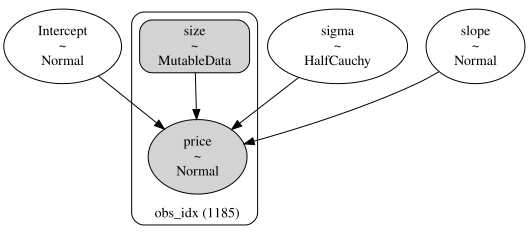

In [63]:
pm.model_to_graphviz(model)

In [64]:
az.plot_trace(idata, figsize=(10, 7));

In [65]:
with model:
    pm.set_data({
        'size': dv['size'],
    })
    # Generate posterior predictive samples
    ppd_dv = pm.sample_posterior_predictive(idata, predictions=True)

Sampling: [price]


In [66]:
columns_order = ['size', 'latitude', 'longitude', 'rooms', 'buildYear',
              'price', 'pred_price', "residual"]

In [67]:
pred_price = (10**ppd_dv.predictions["price"]).mean(dim=["chain", "draw"]).data.round(0)
dv = dv.assign(pred_price=pred_price,
              residual = lambda d: d["price"] - d["pred_price"]).loc[:, columns_order]
dv

,size,latitude,longitude,rooms,buildYear,price,pred_price,residual
0,73.0,55.681720,12.583391,2,1690,5045000.0,3443341.0,1601659.0
1,66.0,55.693832,12.534633,3,1911,3775000.0,3125532.0,649468.0
2,99.0,55.655476,12.505323,3,2020,4250000.0,4927432.0,-677432.0
3,42.0,55.682552,12.562237,1,1969,2920000.0,2241715.0,678285.0
4,78.0,55.705750,12.493167,1,1959,2450000.0,3688759.0,-1238759.0
...,...,...,...,...,...,...,...,...
127,41.0,55.662650,12.606344,1,1940,2000000.0,2202847.0,-202847.0
128,98.0,55.653294,12.565753,4,2019,6000000.0,4880484.0,1119516.0
129,88.0,55.694294,12.534460,4,1913,3795000.0,4214790.0,-419790.0
130,56.0,55.709373,12.564988,2,1934,2920000.0,2712087.0,207913.0


In [68]:
R2 = r2_score(dv["price"], dv["pred_price"]).round(3)
RMSE = f'{int(mean_squared_error(y_true=dv["price"], y_pred=dv["pred_price"], squared=False)):,}'.replace(
    ",", "."
)


(
    dv.plot(
        kind="line",
        y="price",
        title=f"Bayesian: True Sales v/ Predicted Sales: {R2=} RMSE = DKK {RMSE}",
    )
    .update_traces(line=dict(color="blue", width=3))
    .update_layout(
        hovermode="x unified",
        xaxis_title="Apartments",
        yaxis_title="Price (DKK)",
    )
    .add_traces(
        dv.plot(kind="area", y="pred_price")
        .update_traces(
            line=dict(color="black", width=2,),
            fill="tonexty",
            fillcolor='rgba(26,150,65,0.5)',
        )
        .data
    )
)

In [69]:

(
    dv.plot(
        kind="scatter",
        y="residual",
        x=p.index,
        size="size",
        size_max=15,
        title=f"True Sales - Predicted Sales: {R2=} RMSE = DKK {RMSE}",
        **fig_size,
    )
    .add_hline(
        y=0,
        opacity=0.4,
    )
    .update_traces(mode="markers")
    .update_layout(hovermode="y")
)

In [70]:
# price ~ size + rooms + 1    ( X => price ~ size + C(rooms) + 1)

with pm.Model() as model: 
    # Define priors
    sigma = pm.HalfCauchy("sigma", beta=10)
    intercept = pm.HalfNormal("Intercept", sigma=20)
    
    Size = pm.Normal("Size", 0, sigma=20)
    Rooms = pm.Normal("Rooms", 0, sigma=10)

    # data
    size = pm.MutableData('size', dt['size'], dims="obs_idx")
    rooms = pm.MutableData('rooms', dt['rooms'], dims="obs_idx")
    log_price = np.log10(dt['price'].values)
    # Define likelihood
    likelihood = pm.Normal("price", mu=intercept + Size * size + Rooms*rooms, sigma=sigma, observed=log_price, dims="obs_idx")

    # Inference!
    # draw 3000 posterior samples using NUTS sampling
    idata = pm.sample(5000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [sigma, Intercept, Size, Rooms]


Sampling 2 chains for 1_000 tune and 5_000 draw iterations (2_000 + 10_000 draws total) took 39 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


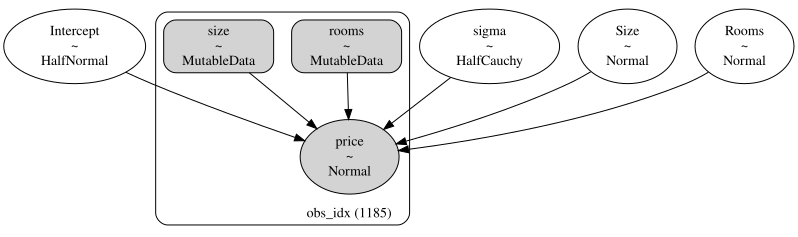

In [71]:
pm.model_to_graphviz(model)

In [72]:
az.plot_trace(idata, figsize=(10, 7));

In [73]:
with model:
    pm.set_data({
        'size': dv['size'],
        'rooms': dv['rooms'],
    })
    # Generate posterior predictive samples
    ppd_dv = pm.sample_posterior_predictive(idata, predictions=True)

Sampling: [price]


In [74]:
pred_price = (10**ppd_dv.predictions["price"]).mean(dim=["chain", "draw"]).data.round(0)

dv = dv.assign(pred_price=pred_price,
              residual = lambda d: d["price"] - d["pred_price"]).loc[:, columns_order]
dv

,size,latitude,longitude,rooms,buildYear,price,pred_price,residual
0,73.0,55.681720,12.583391,2,1690,5045000.0,3299122.0,1745878.0
1,66.0,55.693832,12.534633,3,1911,3775000.0,3280257.0,494743.0
2,99.0,55.655476,12.505323,3,2020,4250000.0,4805661.0,-555661.0
3,42.0,55.682552,12.562237,1,1969,2920000.0,2127276.0,792724.0
4,78.0,55.705750,12.493167,1,1959,2450000.0,3201071.0,-751071.0
...,...,...,...,...,...,...,...,...
127,41.0,55.662650,12.606344,1,1940,2000000.0,2104032.0,-104032.0
128,98.0,55.653294,12.565753,4,2019,6000000.0,5121850.0,878150.0
129,88.0,55.694294,12.534460,4,1913,3795000.0,4588829.0,-793829.0
130,56.0,55.709373,12.564988,2,1934,2920000.0,2714383.0,205617.0


In [75]:
R2 = r2_score(dv["price"], dv["pred_price"]).round(3)
RMSE = f'{int(mean_squared_error(y_true=dv["price"], y_pred=dv["pred_price"], squared=False)):,}'.replace(
    ",", "."
)


(
    dv.plot(
        kind="line",
        y="price",
        title=f"Bayesian: True Sales v/ Predicted Sales: {R2=} RMSE = DKK {RMSE}",
    )
    .update_traces(line=dict(color="blue", width=3))
    .update_layout(
        hovermode="x unified",
        xaxis_title="Apartments",
        yaxis_title="Price",
    )
    .add_traces(
        dv.plot(kind="area", y="pred_price")
        .update_traces(
            line=dict(color="black", width=2,),
            fill="tonexty",
            fillcolor='rgba(26,150,65,0.5)',
        )
        .data
    )
)

In [76]:
import plotly.graph_objs as go

# Calculate R2 and RMSE
R2 = r2_score(dv["price"], dv["pred_price"]).round(3)
RMSE = f'{int(mean_squared_error(y_true=dv["price"], y_pred=dv["pred_price"], squared=False)):,}'.replace(",", ".")

# Create a new figure
fig = go.Figure()

# Add the actual price line
fig.add_trace(
    go.Scatter(
        x=dv.index, 
        y=dv["price"],
        mode='lines',
        name='Actual Price',
        line=dict(color="blue", width=3)
    )
)

# Add the predicted price line with fill down to the x-axis
fig.add_trace(
    go.Scatter(
        x=dv.index, 
        y=dv["pred_price"],
        mode='lines',
        name='Predicted Price',
        line=dict(color="black", width=2),
        fill='tozeroy',  # Changed from 'tonexty' to 'tozeroy'
        fillcolor='rgba(26,150,65,0.5)'
    )
)

# Update the layout of the figure
fig.update_layout(
    title=f"Bayesian: True Sales v/ Predicted Sales: R2={R2} RMSE = DKK {RMSE}",
    hovermode="x unified",
    xaxis_title="Apartments",
    yaxis_title="Price",
    showlegend=True  # Ensure the legend is displayed
)

# Show the figure
fig.show()


In [77]:
dv.shape

(132, 8)

In [78]:
dt.shape

(1185, 6)

In [79]:
rooms, rooms_idx = np.unique(dt["rooms"], return_inverse=True)
log_price = np.log10(dt['price'])

In [80]:
# price ~ size + rooms + 1    ( X => price ~ size + C(rooms) + 1)

In [81]:
coords = {"Rooms": rooms}
with pm.Model(coords=coords) as pooled_model:

    log_price_ = pm.MutableData("log_price", log_price)
    rooms_idx_ = pm.MutableData("rooms_idx", rooms_idx)
    size = pm.MutableData("size", dt["size"].values)
     # Define priors
    
    
    β0 = pm.Normal("β0", 0, sigma=5, dims="Rooms")
    β1 = pm.Normal("β1", 0, sigma=5, dims="Rooms")

    sigma = pm.HalfNormal("σ", sigma=5)


    mu = β0[rooms_idx_] + β1[rooms_idx_] * size
    
     # Define likelihood
    likelihood = pm.Normal("price", mu=mu, sigma=sigma, observed=log_price_, shape=mu.shape)

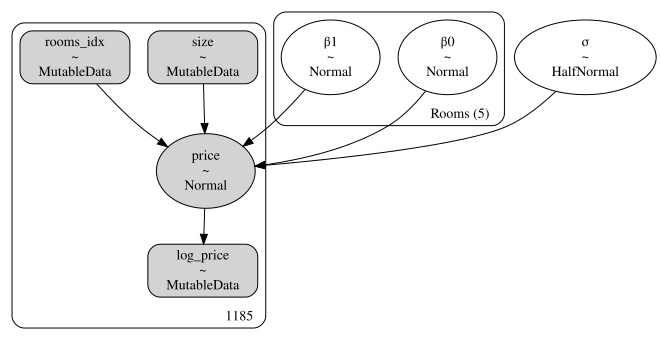

In [82]:
pm.model_to_graphviz(pooled_model)

In [83]:
with pooled_model:
    # Inference!
    # draw 3000 posterior samples using NUTS sampling
    idata = pm.sample(5000)

    

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [β0, β1, σ]


Sampling 2 chains for 1_000 tune and 5_000 draw iterations (2_000 + 10_000 draws total) took 79 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


In [84]:
az.plot_trace(idata, figsize=(10, 7));

In [85]:
# Map the species in the test data to the original index values from the train dataset
name_to_idx_map = {name: index for index, name in pd.Series(rooms).to_dict().items()}
rooms_idx_dv = dv["rooms"].map(name_to_idx_map).to_numpy()

In [86]:
with pooled_model:
    pm.set_data(
        {
            "size": dv["size"].values,
            "rooms_idx": rooms_idx_dv,
        }
    )

In [87]:
with pooled_model:
    # Generate posterior predictive samples
    ppd_dv = pm.sample_posterior_predictive(idata, predictions=True)

Sampling: [price]


In [88]:
pred_price = (10**ppd_dv.predictions["price"]).mean(dim=["chain", "draw"]).data.round(0)

dv = dv.assign(pred_price=pred_price,
              residual = lambda d: d["price"] - d["pred_price"]).loc[:, columns_order]
dv

,size,latitude,longitude,rooms,buildYear,price,pred_price,residual
0,73.0,55.681720,12.583391,2,1690,5045000.0,3432659.0,1612341.0
1,66.0,55.693832,12.534633,3,1911,3775000.0,3563260.0,211740.0
2,99.0,55.655476,12.505323,3,2020,4250000.0,5222801.0,-972801.0
3,42.0,55.682552,12.562237,1,1969,2920000.0,1834642.0,1085358.0
4,78.0,55.705750,12.493167,1,1959,2450000.0,3318253.0,-868253.0
...,...,...,...,...,...,...,...,...
127,41.0,55.662650,12.606344,1,1940,2000000.0,1794704.0,205296.0
128,98.0,55.653294,12.565753,4,2019,6000000.0,5138476.0,861524.0
129,88.0,55.694294,12.534460,4,1913,3795000.0,4764659.0,-969659.0
130,56.0,55.709373,12.564988,2,1934,2920000.0,2624358.0,295642.0


In [89]:
R2 = r2_score(dv["price"], dv["pred_price"]).round(3)
RMSE = f'{int(mean_squared_error(y_true=dv["price"], y_pred=dv["pred_price"], squared=False)):,}'.replace(
    ",", "."
)


(
    dv.plot(
        kind="line",
        y="price",
        title=f"Bayesian: True Sales v/ Predicted Sales: {R2=} RMSE = DKK {RMSE}",
    )
    .update_traces(line=dict(color="blue", width=3))
    .update_layout(
        hovermode="x unified",
        xaxis_title="Apartments",
        yaxis_title="Price (DKK)",
    )
    .add_traces(
        dv.plot(kind="area", y="pred_price")
        .update_traces(
            line=dict(color="black", width=2,),
            fill="tonexty",
            fillcolor='rgba(26,150,65,0.5)',
        )
        .data
    )
)

In [90]:
import plotly.graph_objs as go
import plotly.express as px

# Calculate R2 and RMSE
R2 = r2_score(dv["price"], dv["pred_price"]).round(3)
RMSE = f'{int(mean_squared_error(y_true=dv["price"], y_pred=dv["pred_price"], squared=False)):,}'.replace(",", ".")

# Start with an empty figure
fig = go.Figure()

# Add actual price line with blue color
fig.add_trace(
    go.Scatter(
        x=dv.index, y=dv["price"], 
        mode='lines',
        name='Actual Price',
        line=dict(color='blue', width=3)
    )
)

# Add predicted price line with green color and fill
fig.add_trace(
    go.Scatter(
        x=dv.index, y=dv["pred_price"], 
        mode='lines',
        name='Predicted Price',
        line=dict(color='black', width=2),
        fill='tozeroy',
        fillcolor='rgba(26,150,65,0.5)'
    )
)

# Update layout with titles, labels and show legend
fig.update_layout(
    title=f"Bayesian: True Sales v/ Predicted Sales: R2={R2} RMSE = DKK {RMSE}",
    xaxis_title="Apartments",
    yaxis_title="Price (DKK)",
    hovermode="x unified"
)

# Show the figure
fig.show()

In [91]:
(10**ppd_dv.predictions["price"])[0]

<xarray.DataArray 'price' (draw: 5000, price_dim_2: 132)>
array([[3771726.50637441, 3379857.93366148, 4352641.35253268, ...,
        4596788.50543765, 1775459.47581105, 3224512.80699877],
       [3462096.53983545, 4669116.06447478, 4263479.09919053, ...,
        3734169.79189813, 2946614.9079854 , 2902185.53639538],
       [4768845.09659148, 3673878.85146601, 8163271.28401095, ...,
        4747766.74155314, 2803942.57236168, 4611818.01355457],
       ...,
       [3296526.56107299, 4065458.89421125, 5123155.42485854, ...,
        5106002.6747434 , 2419680.06182433, 3542975.85718663],
       [3555655.39716871, 3499773.22578029, 4320199.86646136, ...,
        7165696.70415821, 2936622.2753995 , 5218174.89617697],
       [4229554.4735409 , 2657199.54519279, 4713861.07102667, ...,
        4943118.38615567, 2241684.93284538, 3481386.88912938]])
Coordinates:
    chain        int64 0
  * draw         (draw) int64 0 1 2 3 4 5 6 ... 4994 4995 4996 4997 4998 4999
  * price_dim_2  (price_dim_2) int64 0 1 2 3 4 5 6 ... 126 127 128 129 130 131

In [92]:
dv["price"][0]

5045000.0